In [1]:
import torch
import pandas as pd

from torch_geometric.data import Data
from torch_geometric.loader import DataLoader

import numpy as np
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
import matplotlib.pyplot as plt

# Data loading and preparation

In [2]:
edges = pd.read_csv("../data/interim/edges.csv")

In [3]:
edges[edges.type == "sc2vis"][edges[edges.type == "sc2vis"].celltype_major.isna()]

,Unnamed: 0,node1,node2,type,celltype_major,celltype_minor,clone


In [4]:
overcl = pd.read_csv("../data/interim/clones_over.csv")

In [5]:
overcl.columns = ["node1","clone"]

In [6]:
overcl.clone.unique()

array(['16', '10', '0', 'diploid', '12', '8', '13', '14', '1', '7', '15',
       '4', '6', '9', '5', '11', '2', '3'], dtype=object)

In [7]:
edges = edges.drop(columns = ["clone"])


In [8]:
overcl = edges[edges["type"] == "sc2vis"].merge(overcl,left_on = "node1",right_on ="node1",how = "left")

In [9]:
overcl.clone = overcl.clone.fillna("diploid")

In [10]:
overcl.clone.unique()

array(['diploid', '11', '2', '10', '8', '6', '1', '13', '4', '15', '14',
       '9', '7', '0', '5', '12', '16', '3'], dtype=object)

In [11]:
edges= edges.merge(overcl[["clone","node1"]],left_on = "node1",right_on ="node1",how = "left")

In [12]:
emb_vis = pd.read_csv("../data/interim/embedding_visium_scvi.csv", index_col = 0)
emb_rna = pd.read_csv("../data/interim/embedding_rna2vis_scvi.csv", index_col = 0)

In [13]:
all_nodes_graph = set(edges.node1.to_list() + edges.node2.to_list())
all_nodes_emb = set(emb_vis.index).union(set(emb_rna.index))
all_nodes = list(all_nodes_graph.intersection(all_nodes_emb))
node_encoder = {all_nodes[i]:i for i in range(len(all_nodes))}
emb_vis = emb_vis.loc[emb_vis.index.isin(all_nodes)]
emb_rna = emb_rna.loc[emb_rna.index.isin(all_nodes)]

In [14]:
edges = edges[edges.node1.isin(all_nodes)]

In [15]:
edges = edges[edges.node2.isin(all_nodes)]

In [16]:
edges.node1 = edges.node1.map(node_encoder)

In [17]:
edges.node2 = edges.node2.map(node_encoder)

In [18]:
emb_vis = emb_vis.rename(index = node_encoder)
emb_rna = emb_rna.rename(index = node_encoder)

In [19]:
len(all_nodes)

34079

In [20]:
edge_index = torch.tensor([edges.node1,
                           edges.node2], dtype=torch.long)

In [21]:
features = pd.concat([emb_vis, emb_rna])

In [22]:
features = features.sort_index()

In [23]:
x = torch.tensor(features.values , dtype=torch.float)

In [24]:
edges[edges.type == "vis2grid"]

,Unnamed: 0,node1,node2,type,celltype_major,celltype_minor,clone
2908700,298910,15694,20569,vis2grid,NaN,NaN,NaN
2908701,298911,15694,11809,vis2grid,NaN,NaN,NaN
2908702,298912,14503,17046,vis2grid,NaN,NaN,NaN
2908703,298913,14503,16950,vis2grid,NaN,NaN,NaN
2908704,298914,14503,4974,vis2grid,NaN,NaN,NaN
...,...,...,...,...,...,...,...
2928253,318463,11844,2567,vis2grid,NaN,NaN,NaN
2928254,318464,11844,9501,vis2grid,NaN,NaN,NaN
2928255,318465,11844,2819,vis2grid,NaN,NaN,NaN
2928256,318466,28184,33030,vis2grid,NaN,NaN,NaN


In [25]:
edges.clone = edges.clone.fillna("missing")

In [26]:
edges[edges.clone == "missing"]

,Unnamed: 0,node1,node2,type,celltype_major,celltype_minor,clone
2908700,298910,15694,20569,vis2grid,NaN,NaN,missing
2908701,298911,15694,11809,vis2grid,NaN,NaN,missing
2908702,298912,14503,17046,vis2grid,NaN,NaN,missing
2908703,298913,14503,16950,vis2grid,NaN,NaN,missing
2908704,298914,14503,4974,vis2grid,NaN,NaN,missing
...,...,...,...,...,...,...,...
2928253,318463,11844,2567,vis2grid,NaN,NaN,missing
2928254,318464,11844,9501,vis2grid,NaN,NaN,missing
2928255,318465,11844,2819,vis2grid,NaN,NaN,missing
2928256,318466,28184,33030,vis2grid,NaN,NaN,missing


In [28]:
nodes_atr = edges[["node1","type","celltype_major", "clone"]].drop_duplicates()

In [29]:
nodes_atr = nodes_atr.sort_values(by = "node1")

In [30]:
nodes_atr.clone.unique()

array(['diploid', '10', '4', '6', 'missing', '2', '9', '0', '11', '1',
       '8', '7', '5', '14', '13', '12', '15', '3', '16'], dtype=object)

In [31]:
nodes_atr.celltype_major = nodes_atr.celltype_major.fillna("missing")

In [32]:
nodes_atr

,node1,type,celltype_major,clone
1124300,0,sc2vis,Myeloid,diploid
1840000,1,sc2vis,Cancer Epithelial,10
2494300,2,sc2vis,Cancer Epithelial,4
261800,3,sc2vis,Cancer Epithelial,6
2039800,4,sc2vis,T.cells,diploid
...,...,...,...,...
832800,34074,sc2vis,Myeloid,4
2924512,34075,vis2grid,missing,missing
2760300,34076,sc2vis,Normal Epithelial,5
2329800,34077,sc2vis,Plasmablasts,diploid


In [34]:
from collections import Counter

Counter(nodes_atr.celltype_major)

Counter({'Myeloid': 3868,
         'Cancer Epithelial': 8503,
         'T.cells': 5983,
         'missing': 4992,
         'CAFs': 2592,
         'Normal Epithelial': 4033,
         'Endothelial': 1346,
         'B.cells': 1018,
         'Plasmablasts': 1275,
         'PVL': 469})

In [35]:
ct_list = list(nodes_atr.celltype_minor.unique())
ct_list.remove("missing")

AttributeError: 'DataFrame' object has no attribute 'celltype_minor'

In [36]:
Counter(nodes_atr.clone)

Counter({'diploid': 19626,
         '10': 511,
         '4': 801,
         '6': 645,
         'missing': 4992,
         '2': 925,
         '9': 483,
         '0': 1502,
         '11': 367,
         '1': 1236,
         '8': 583,
         '7': 599,
         '5': 816,
         '14': 224,
         '13': 304,
         '12': 315,
         '15': 67,
         '3': 22,
         '16': 61})

In [37]:
clone_list = list(nodes_atr.clone.unique())
clone_list.remove("missing")
clone_list.remove("diploid")
clone_dict = {x:int(x) for x in clone_list}
clone_dict["missing"] = -1
clone_dict["diploid"] = len(clone_dict)-1

In [38]:
clone_dict

{'10': 10,
 '4': 4,
 '6': 6,
 '2': 2,
 '9': 9,
 '0': 0,
 '11': 11,
 '1': 1,
 '8': 8,
 '7': 7,
 '5': 5,
 '14': 14,
 '13': 13,
 '12': 12,
 '15': 15,
 '3': 3,
 '16': 16,
 'missing': -1,
 'diploid': 17}

In [42]:
    ct_list = list(nodes_atr.celltype_major.unique())
    ct_list.remove("missing")

In [43]:
type_dict = {ct_list[i]:i for i in range(len(ct_list))}

In [44]:
type_dict["missing"] = -1

In [45]:
type_dict

{'Myeloid': 0,
 'Cancer Epithelial': 1,
 'T.cells': 2,
 'CAFs': 3,
 'Normal Epithelial': 4,
 'Endothelial': 5,
 'B.cells': 6,
 'Plasmablasts': 7,
 'PVL': 8,
 'missing': -1}

In [46]:
nodes_atr.clone = nodes_atr.clone.map(clone_dict)

In [47]:
edges.celltype_major = edges.celltype_major.fillna("missing")

In [48]:
nodes_atr.celltype_major = nodes_atr.celltype_major.map(type_dict)

In [49]:
nodes_atr = nodes_atr.set_index("node1")

In [50]:
nodes_atr.head()

,type,celltype_major,clone
node1,,,
0,sc2vis,0,17
1,sc2vis,1,10
2,sc2vis,1,4
3,sc2vis,1,6
4,sc2vis,2,17


In [51]:
features = features.join(nodes_atr)

In [52]:
features.clone = features.clone.fillna(-1)

In [54]:
features.celltype_minor = features.celltype_major.fillna(-1)

/tmp/ipykernel_55407/1564475588.py:1: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  features.celltype_minor = features.celltype_major.fillna(-1)


In [55]:
y_clone = torch.tensor(features.clone.values,dtype=torch.long)


In [56]:
y_type = torch.tensor(features.celltype_minor.values,dtype=torch.long)

In [57]:
y_type.unique()

tensor([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8])

In [58]:
y_clone.unique()

tensor([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17])

In [59]:
data = Data(x=x, edge_index=edge_index, y_clone = y_clone,y_type = y_type, edge_type = edges.type.values)

In [60]:
data.validate(raise_on_error=True)


True

In [61]:
data

Data(x=[34079, 2], edge_index=[2, 2928258], y_clone=[34079], y_type=[34079], edge_type=[2928258])

In [62]:
torch.save(data,"../data/processed/gnn_data.pt")

In [63]:
hold_out = torch.tensor(np.where(data.y_clone == -1)[0],dtype=torch.long)

In [64]:
tot_size = data.x.shape[0] -len(hold_out)
train_size = int(0.8*tot_size)
hold_in = np.arange(data.x.shape[0])
hold_in = [x for x in hold_in if x not in  hold_out]

In [65]:
len(hold_out)

4992

In [66]:
data.y_type[hold_in].unique()

tensor([0, 1, 2, 3, 4, 5, 6, 7, 8])

In [67]:
data.y_clone[hold_in].unique()

tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17])

In [68]:
from sklearn.model_selection import train_test_split

train_samp,test_samp,_,_ = train_test_split(hold_in,data.y_clone[hold_in], stratify = data.y_clone[hold_in], test_size=0.2, random_state=42)


In [69]:
data.train_mask = torch.tensor(train_samp,dtype=torch.long)
data.test_mask = torch.tensor(test_samp,dtype=torch.long)
data.hold_out = hold_out

In [70]:
data.train_mask = torch.tensor(train_samp,dtype=torch.long)
data.test_mask = torch.tensor(test_samp,dtype=torch.long)
data.hold_out = hold_out

In [71]:
y_train = data.y_type[data.train_mask]
class_sample_count = np.array(
    [len(np.where(y_train == t)[0]) for t in np.unique(y_train)])
weight_type = 1. / class_sample_count

In [72]:
y_train = data.y_clone[data.train_mask]
class_sample_count = np.array(
    [len(np.where(y_train == t)[0]) for t in np.unique(y_train)])
weight_clone = 1. / class_sample_count

In [73]:
weight_clone = torch.tensor(weight_clone, dtype=torch.float)
weight_type = torch.tensor(weight_type, dtype=torch.float)

In [74]:
len(edges.clone.unique())

19

In [75]:
data.num_classes_clone = len(y_clone.unique())
data.num_classes_type = len(y_type.unique())

In [76]:



class GCN(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = GCNConv(data.num_node_features, 16)
        self.conv2 = GCNConv(16, 16)
        self.conv3 = GCNConv(16, 16)


        # self.conv_clone = GCNConv(16, data.num_classes_clone - 1)
        # self.conv_type = GCNConv(16, data.num_classes_type-1)
        self.out = GCNConv(16,data.num_classes_clone +  data.num_classes_type -2)


    def forward(self, x, edge_index):

        x = self.conv1(x, edge_index)
        x = self.conv2(x, edge_index)
        x = self.conv3(x, edge_index)

        x_pre = F.relu(x)
        x_out = self.out(x_pre, edge_index)


        return (x_out)

In [77]:
device = torch.device('cuda:0')
model = GCN().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01, weight_decay=5e-4)

In [78]:
weight_clone = weight_clone.to(device)
weight_type = weight_type.to(device)

In [79]:
data = data.to(device)


In [80]:
def test():
    model.eval()
    with torch.no_grad():
        pred = model(data.x, data.edge_index)
        pred_clone = pred[:,:data.num_classes_clone-1]
        pred_cell_type = pred[:,data.num_classes_clone-1:]
        pred_clone = F.log_softmax(pred_clone, dim=1)
        loss_clone = weighted_loss(pred_clone[data.test_mask], norm_sim, data.y_clone[data.test_mask],weight_clone)

        pred_clone = pred_clone.argmax(dim=1)
        pred_cell_type = F.log_softmax(pred_cell_type, dim=1)
        loss_ct = F.nll_loss(pred_cell_type[data.test_mask], data.y_type[data.test_mask], weight = weight_type)
        pred_cell_type = pred_cell_type.argmax(dim=1)

        correct_clones = (pred_clone[data.test_mask] == data.y_clone[data.test_mask]).sum()
        correct_types = (pred_cell_type[data.test_mask] == data.y_type[data.test_mask]).sum()

        acc_clone = int(correct_clones) / len(data.test_mask)
        acc_type = int(correct_types) / len(data.test_mask)
        

    
    # reducer = umap.UMAP()
    # emb = pred[-1].detach().numpy()
    # scaled_penguin_data = StandardScaler().fit_transform(emb)
    # embedding = reducer.fit_transform(scaled_penguin_data)
    # sns.scatterplot(x = embedding[:, 0], y = embedding[:, 1], hue = data.node_type)
    # plt.show()
        return(acc_clone,acc_type, loss_clone,loss_ct)

In [81]:
norm_sim = np.load("../data/interim/clone_dist_over.npy")

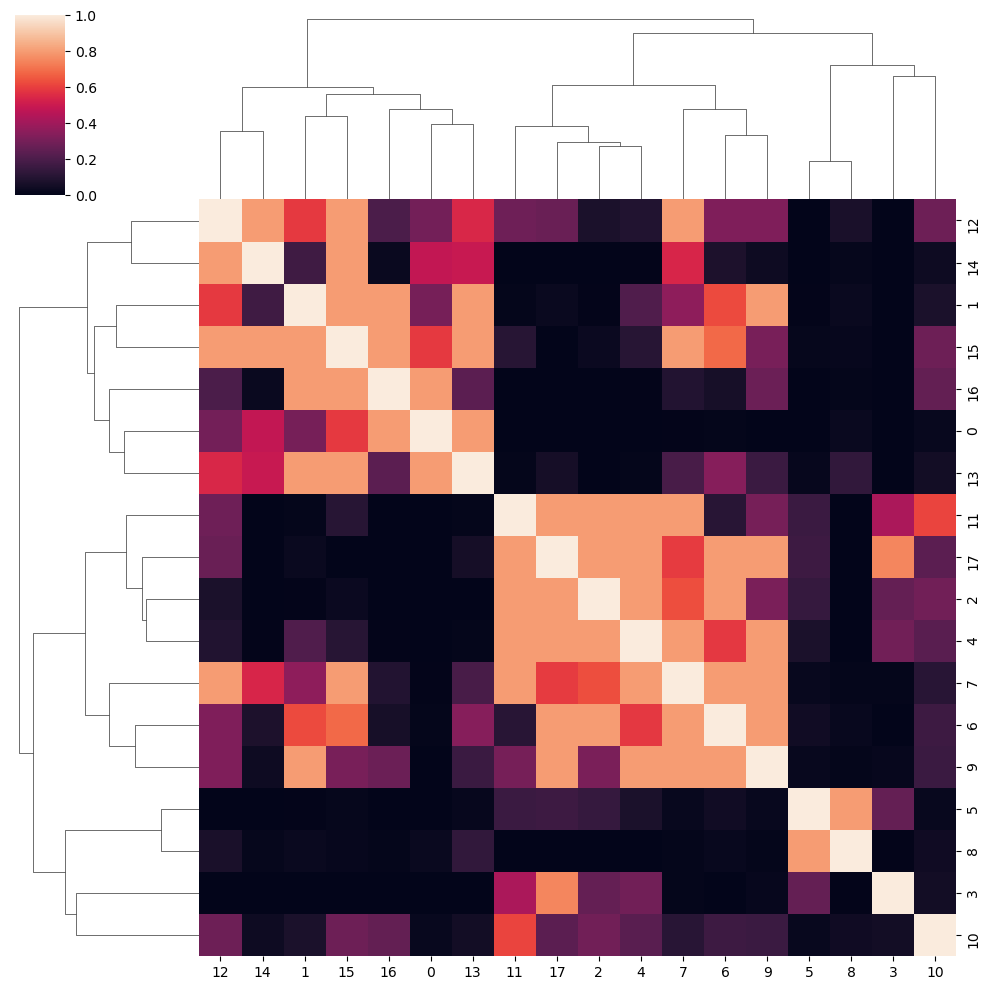

In [82]:
import seaborn as sns
sns.clustermap(norm_sim)

In [83]:
# norm_sim = np.identity(norm_sim.shape[0])

In [84]:
norm_sim = torch.tensor(norm_sim)
norm_sim = norm_sim.to(device)

In [85]:
def weighted_loss(probabilities, norm_sim, target, weight):
        probabilities = torch.exp(probabilities) 
        similarity = torch.tensor(norm_sim[target,:]).to(device)
        level_loss=-torch.log((probabilities * similarity).sum(axis = 1))
        level_loss_weighted = level_loss * weight[target]
        reduction = (level_loss_weighted / weight[target].sum()).sum()
        return(reduction)
def check_split(y):
    #chec if all classes are present in both train and test set
    num_classes = len(y.unique()) -1
    assert sum(y[data.train_mask].unique() == y[data.train_mask].unique()) == num_classes
    

In [86]:
check_split(data.y_type)

In [87]:
check_split(data.y_clone)

In [88]:
eps = 1e-4
loss_old = 100
losses = {}
accuracy = {}
losses["clone"] = dict({"train":[],"test":[]})
losses["cell_type"] = dict({"train":[],"test":[]})
accuracy["clone"] = dict({"train":[],"test":[]})
accuracy["cell_type"] = dict({"train":[],"test":[]})
no_improv = 0
for epoch in range(300):
    model.train()
    optimizer.zero_grad()
    pred= model(data.x, data.edge_index)
    pred_clone = pred[:,:data.num_classes_clone-1]
    pred_cell_type = pred[:,data.num_classes_clone-1:]
    pred_clone = F.log_softmax(pred_clone, dim=1)
    pred_cell_type = F.log_softmax(pred_cell_type, dim=1)
    loss_clone = weighted_loss(pred_clone[data.train_mask], norm_sim, data.y_clone[data.train_mask],weight_clone)
    # loss_clone = F.nll_loss(pred_clone[data.train_mask], data.y_clone[data.train_mask], weight = weight_clone)

    losses["clone"]["train"].append(loss_clone.item())

    loss_type = F.nll_loss(pred_cell_type[data.train_mask], data.y_type[data.train_mask], weight = weight_type)
    losses["cell_type"]["train"].append(loss_type.item())
    loss = torch.log(torch.sqrt(loss_clone*loss_type))
    loss.backward()
    optimizer.step()
    
    acc_clone,acc_type, loss_clone_test,loss_ct_test = test()
    if epoch%20==0:
        print(f"epoch {epoch}: Clone prediction loss {loss_clone.item():.3f} \t Cell type prediction loss: {loss_type.item():.3f}")
        print(f"TEST: Clone accuracy {acc_clone:.4f} \t Cell type accuracy: {acc_type:.4f}")
    accuracy["clone"]["test"].append(acc_clone)
    accuracy["cell_type"]["test"].append(acc_type)
    losses["cell_type"]["test"].append(loss_ct_test.detach().cpu().item())
    losses["clone"]["test"].append(loss_clone_test.detach().cpu().item())


    # loss = loss_clone + loss_type

    if (loss_old- loss_clone.item() <eps):
        no_improv += 1
        print(f"no improvement ({no_improv})")
    else:
        no_improv = 0
    if (no_improv >10) & (epoch>100):
        print("EARLY STOPPING")
        break
    loss_old = loss_clone.item()
print("DONE")


/tmp/ipykernel_55407/3033082611.py:3: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  similarity = torch.tensor(norm_sim[target,:]).to(device)


epoch 0: Clone prediction loss 1.220 	 Cell type prediction loss: 2.301
TEST: Clone accuracy 0.0206 	 Cell type accuracy: 0.1219
epoch 20: Clone prediction loss 0.720 	 Cell type prediction loss: 1.457
TEST: Clone accuracy 0.4134 	 Cell type accuracy: 0.4957
epoch 40: Clone prediction loss 0.620 	 Cell type prediction loss: 1.273
TEST: Clone accuracy 0.4273 	 Cell type accuracy: 0.6765


epoch 60: Clone prediction loss 0.581 	 Cell type prediction loss: 1.138
TEST: Clone accuracy 0.4287 	 Cell type accuracy: 0.6994
epoch 80: Clone prediction loss 0.559 	 Cell type prediction loss: 1.050
TEST: Clone accuracy 0.4292 	 Cell type accuracy: 0.7111
no improvement (1)
epoch 100: Clone prediction loss 0.544 	 Cell type prediction loss: 1.009
TEST: Clone accuracy 0.3993 	 Cell type accuracy: 0.7262
no improvement (1)
no improvement (1)
no improvement (1)
no improvement (2)
no improvement (3)
no improvement (1)
no improvement (2)
no improvement (3)
epoch 120: Clone prediction loss 0.538 	 Cell type prediction loss: 0.984
TEST: Clone accuracy 0.4024 	 Cell type accuracy: 0.7436
no improvement (1)
no improvement (2)
no improvement (3)
no improvement (4)
epoch 140: Clone prediction loss 0.533 	 Cell type prediction loss: 0.965
TEST: Clone accuracy 0.4187 	 Cell type accuracy: 0.7436
no improvement (1)
no improvement (2)
no improvement (3)
no improvement (4)
no improvement (5)
no im

In [89]:
loss_type

tensor(0.9392, device='cuda:0', grad_fn=<NllLossBackward0>)

In [90]:
for epoch in range(100):
    model.train()
    optimizer.zero_grad()
    pred= model(data.x, data.edge_index)
    pred_clone = pred[:,:data.num_classes_clone-1]
    pred_cell_type = pred[:,data.num_classes_clone-1:]
    pred_clone = F.log_softmax(pred_clone, dim=1)
    pred_cell_type = F.log_softmax(pred_cell_type, dim=1)
    # loss_clone = weighted_loss(pred_clone[data.train_mask], norm_sim, data.y_clone[data.train_mask],weight_clone)
    loss_clone = F.nll_loss(pred_clone[data.train_mask], data.y_clone[data.train_mask], weight = weight_clone)

    losses["clone"]["train"].append(loss_clone.item())

    loss_type = F.nll_loss(pred_cell_type[data.train_mask], data.y_type[data.train_mask], weight = weight_type)
    losses["cell_type"]["train"].append(loss_type.item())
    loss = torch.log(torch.sqrt(loss_clone*loss_type))
    loss.backward()
    optimizer.step()
    
    acc_clone,acc_type, loss_clone_test,loss_ct_test = test()
    # if epoch%20==0:
    print(f"epoch {epoch}: Clone prediction loss {loss_clone.item():.3f} \t Cell type prediction loss: {loss_type.item():.3f}")
    print(f"TEST: Clone accuracy {acc_clone:.4f} \t Cell type accuracy: {acc_type:.4f}")
    accuracy["clone"]["test"].append(acc_clone)
    accuracy["cell_type"]["test"].append(acc_type)
    losses["cell_type"]["test"].append(loss_ct_test.detach().cpu().item())
    losses["clone"]["test"].append(loss_clone_test.detach().cpu().item())


    loss_old = loss_clone.item()


/tmp/ipykernel_55407/3033082611.py:3: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  similarity = torch.tensor(norm_sim[target,:]).to(device)


epoch 0: Clone prediction loss 21.814 	 Cell type prediction loss: 0.940
TEST: Clone accuracy 0.4677 	 Cell type accuracy: 0.7549
epoch 1: Clone prediction loss 20.413 	 Cell type prediction loss: 0.941
TEST: Clone accuracy 0.4658 	 Cell type accuracy: 0.7497
epoch 2: Clone prediction loss 18.277 	 Cell type prediction loss: 0.943
TEST: Clone accuracy 0.4584 	 Cell type accuracy: 0.7381
epoch 3: Clone prediction loss 15.744 	 Cell type prediction loss: 0.950
TEST: Clone accuracy 0.4488 	 Cell type accuracy: 0.7399
epoch 4: Clone prediction loss 13.093 	 Cell type prediction loss: 0.958
TEST: Clone accuracy 0.4452 	 Cell type accuracy: 0.7331
epoch 5: Clone prediction loss 10.493 	 Cell type prediction loss: 0.968
TEST: Clone accuracy 0.4168 	 Cell type accuracy: 0.7241
epoch 6: Clone prediction loss 8.048 	 Cell type prediction loss: 0.980
TEST: Clone accuracy 0.3582 	 Cell type accuracy: 0.7205
epoch 7: Clone prediction loss 5.853 	 Cell type prediction loss: 0.994
TEST: Clone accurac

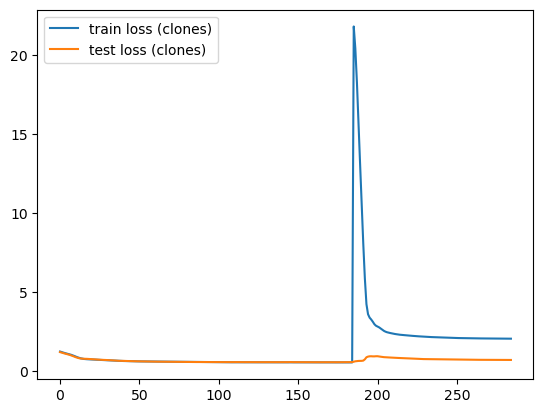

In [91]:
#plt.plot(loss_clones, label = "train loss (clones)")
plt.plot(losses["clone"]["train"], label = "train loss (clones)")
plt.plot(losses["clone"]["test"], label = "test loss (clones)")

plt.legend()
plt.show()

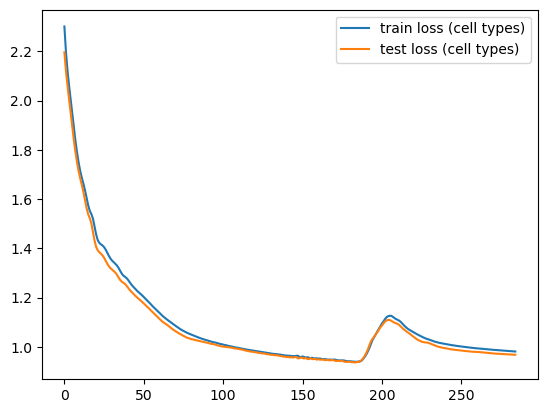

In [92]:
#plt.plot(loss_clones, label = "train loss (clones)")
plt.plot(losses["cell_type"]["train"], label = "train loss (cell types)")
plt.plot(losses["cell_type"]["test"], label = "test loss (cell types)")

plt.legend()
plt.show()

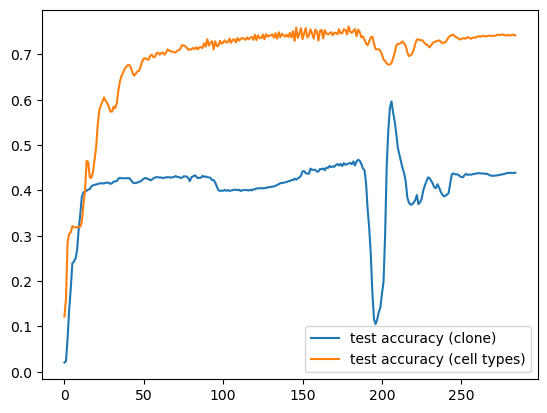

In [93]:
#plt.plot(loss_clones, label = "train loss (clones)")
plt.plot(accuracy["clone"]["test"], label = "test accuracy (clone)")
plt.plot(accuracy["cell_type"]["test"], label = "test accuracy (cell types)")

plt.legend()
plt.show()

In [180]:
model.eval()
pred = model(data.x, data.edge_index)
pred_clone = pred[:,:data.num_classes_clone-1]
pred_cell_type = pred[:,data.num_classes_clone-1:]
pred_clone = F.log_softmax(pred_clone, dim=1)
pred_clone1 = pred_clone.argmax(dim=1)
pred_cell_type = F.log_softmax(pred_cell_type, dim=1)
pred_cell_type1 = pred_cell_type.argmax(dim=1)

correct_clones = (pred_clone1[data.test_mask] == data.y_clone[data.test_mask]).sum()
correct_types = (pred_cell_type1[data.test_mask] == data.y_type[data.test_mask]).sum()

acc_clone = int(correct_clones) / len(data.test_mask)
acc_type = int(correct_types) / len(data.test_mask)

print(f'Accuracy clones: {acc_clone:.4f}')
print(f'Accuracy cell types: {acc_type:.4f}')

Accuracy clones: 0.4930
Accuracy cell types: 0.4309


In [181]:
clone_rev = {val:key for key,val in clone_dict.items()}
type_rev = {val:key for key,val in type_dict.items()}
node_encoder_rev = {val:key for key,val in node_encoder.items()}

In [182]:
pred_clone

tensor([[-1.0322e+01, -6.7720e+00, -2.9770e+00,  ..., -1.0053e+01,
         -1.4325e+01, -2.0286e-01],
        [-1.6944e+01, -1.0108e+01, -5.5476e+00,  ..., -1.3631e+01,
         -5.4392e+01, -1.3142e-01],
        [-3.8056e+00, -3.8658e+00, -2.0706e+00,  ..., -3.4079e+00,
         -3.2377e+01, -1.2052e+00],
        ...,
        [-5.5810e+00, -4.9831e+00, -3.4062e+00,  ..., -3.0989e+00,
         -2.2072e+01, -2.2945e+00],
        [-3.8281e+01, -2.2546e+01, -1.0689e+01,  ..., -2.8757e+01,
         -1.1438e+02, -4.0878e-03],
        [-6.8602e+00, -5.5181e+00, -7.0507e+00,  ..., -2.2792e+00,
         -1.2561e+01, -9.4982e+00]], device='cuda:0',
       grad_fn=<LogSoftmaxBackward0>)

In [183]:
pred = model(data.x, data.edge_index)
pred_clone = pred[:,:data.num_classes_clone-1]
pred_cell_type = pred[:,data.num_classes_clone-1:]
pred_clone = np.exp(F.log_softmax(pred_clone, dim=1).detach().cpu().numpy())
pred_cell_type = np.exp(F.log_softmax(pred_cell_type, dim=1).detach().cpu().numpy())

In [184]:
pred_clone

array([[3.2905402e-05, 1.1453537e-03, 5.0944105e-02, ..., 4.3058630e-05,
        6.0108954e-07, 8.1639397e-01],
       [4.3783285e-08, 4.0747655e-05, 3.8969123e-03, ..., 1.2021039e-06,
        2.3858412e-24, 8.7684804e-01],
       [2.2246042e-02, 2.0945393e-02, 1.2611431e-01, ..., 3.3109639e-02,
        8.6891494e-15, 2.9963818e-01],
       ...,
       [3.7688762e-03, 6.8531004e-03, 3.3166416e-02, ..., 4.5099691e-02,
        2.5969674e-10, 1.0080675e-01],
       [2.3694152e-17, 1.6164509e-10, 2.2785407e-05, ..., 3.2436019e-13,
        0.0000000e+00, 9.9592054e-01],
       [1.0486817e-03, 4.0135263e-03, 8.6679315e-04, ..., 1.0236303e-01,
        3.5068178e-06, 7.4988944e-05]], dtype=float32)

In [185]:
cells_hold_out =[node_encoder_rev[x.item()] for x in data.hold_out]

In [186]:
clone_res = pd.DataFrame(pred_clone[data.hold_out.detach().cpu().numpy()], index = cells_hold_out)

In [187]:
clone_res.columns =list(np.arange(pred_clone.shape[1]))[:-1] + ["diploid"]

In [188]:
ct_res = pd.DataFrame(pred_cell_type[data.hold_out.detach().cpu().numpy()], index = cells_hold_out)
ct_res.columns = [type_rev[x] for x in ct_res.columns]

In [189]:
import scanpy as sc


In [190]:
path = "../data/raw/visium/"
visium = sc.read_visium(path, genome=None, count_file='CytAssist_FFPE_Human_Breast_Cancer_filtered_feature_bc_matrix.h5',
                        library_id=None, load_images=True, source_image_path=None)
visium.var_names_make_unique()

/home/o313a/miniconda3/envs/torch_gnn/lib/python3.10/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [191]:
coor_int = [[int(x[0]),int(x[1])] for x in visium.obsm["spatial"]]
visium.obsm["spatial"] = np.array(coor_int)

In [192]:
clones_columns = clone_res.columns
ct_columns = ct_res.columns

In [193]:
visium.obs = visium.obs.join(clone_res).join(ct_res)

In [194]:
visium.obs["clone"] = visium.obs[clones_columns].idxmax(axis = 1)

In [195]:
visium.obs["clone"].unique()

array(['diploid', 5, 10, 3, 8, 0, 11, 12, 15, 14, 13, 6, 16, 7, 9, 2, 4],
      dtype=object)

In [196]:
visium.obs.clone = visium.obs.clone.astype("str")

In [197]:
import matplotlib as mpl


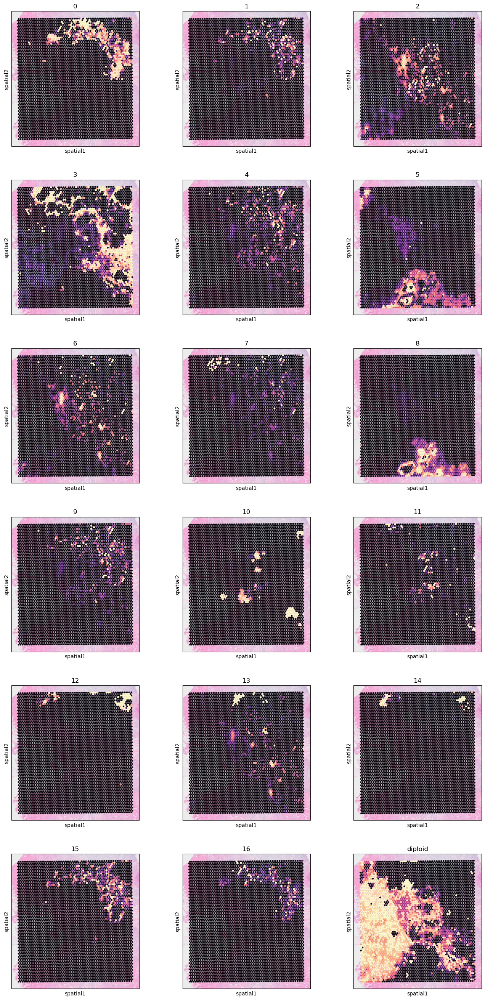

In [198]:
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):

    sc.pl.spatial(visium, cmap='magma',
                  # show first 8 cell types
                  color=clones_columns,
                  ncols=3, size=1.3,
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  vmin=0, vmax='p99.2',
                  colorbar_loc = None
                 )

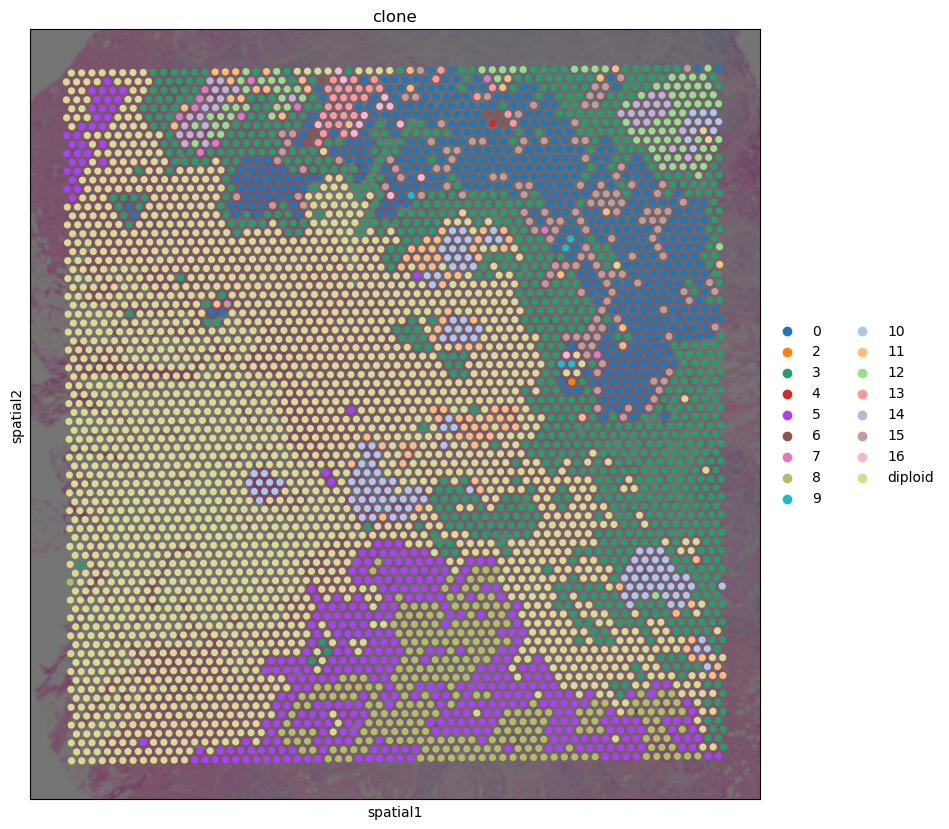

In [199]:
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [10, 10]}):
    sc.pl.spatial(visium, cmap='magma',
                  # show first 8 cell types
                  color="clone",
                img_key='lowres', alpha_img = 0.5,
                 )

In [200]:
visium.obs["cell_type"] = visium.obs[ct_columns].idxmax(axis = 1)

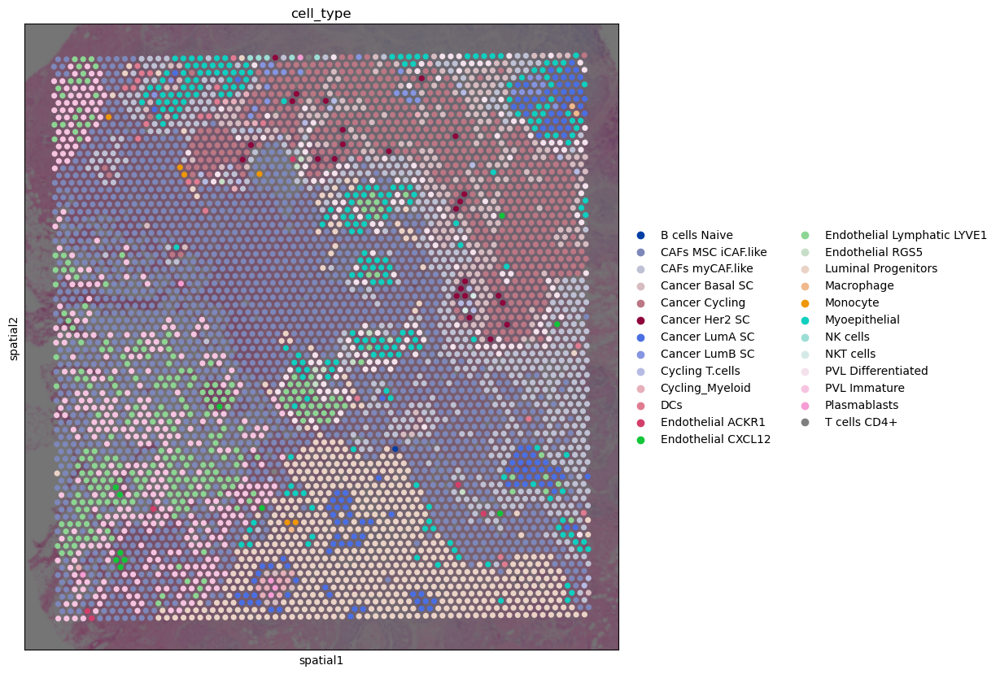

In [201]:
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [10, 10]}):
    sc.pl.spatial(visium, cmap='magma',
                  # show first 8 cell types
                  color="cell_type",
                img_key='lowres', alpha_img = 0.5,
                 )

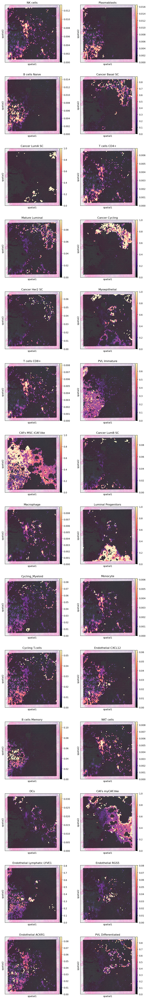

In [202]:
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):

    sc.pl.spatial(visium, cmap='magma',
                  # show first 8 cell types
                  color=ct_columns,
                  ncols=2, size=1.3,
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  vmin=0, vmax='p99.2',
                  show=False
                 )

In [210]:
set([(tup.celltype_major, tup.celltype_minor) for tup in edges.itertuples()])


{('B.cells', 'B cells Memory'),
 ('B.cells', 'B cells Naive'),
 ('CAFs', 'CAFs MSC iCAF.like'),
 ('CAFs', 'CAFs myCAF.like'),
 ('Cancer Epithelial', 'Cancer Basal SC'),
 ('Cancer Epithelial', 'Cancer Cycling'),
 ('Cancer Epithelial', 'Cancer Her2 SC'),
 ('Cancer Epithelial', 'Cancer LumA SC'),
 ('Cancer Epithelial', 'Cancer LumB SC'),
 ('Endothelial', 'Endothelial ACKR1'),
 ('Endothelial', 'Endothelial CXCL12'),
 ('Endothelial', 'Endothelial Lymphatic LYVE1'),
 ('Endothelial', 'Endothelial RGS5'),
 ('Myeloid', 'Cycling_Myeloid'),
 ('Myeloid', 'DCs'),
 ('Myeloid', 'Macrophage'),
 ('Myeloid', 'Monocyte'),
 ('Normal Epithelial', 'Luminal Progenitors'),
 ('Normal Epithelial', 'Mature Luminal'),
 ('Normal Epithelial', 'Myoepithelial'),
 ('PVL', 'Cycling PVL'),
 ('PVL', 'PVL Differentiated'),
 ('PVL', 'PVL Immature'),
 ('Plasmablasts', 'Plasmablasts'),
 ('T.cells', 'Cycling T.cells'),
 ('T.cells', 'NK cells'),
 ('T.cells', 'NKT cells'),
 ('T.cells', 'T cells CD4+'),
 ('T.cells', 'T cells CD8

In [136]:
visium.obs.columns = [str(x) for x in visium.obs.columns]

In [137]:
visium.write("../data/interim/visium_annotated_over.h5ad")
